Nama : Andrew 

NIM : 2540119601

Kelas : LA09

Mata Kuliah : Deep Learning

Jurusan : Data Science

#### 2A. [LO 3, 5 poin] Lakukan eksplorasi terhadap data tersebut dengan melihat histogram warnanya dan lakukan proses augmentasi data jika diperlukan. Dan kemudian lakukan resize resolusi gambar menjadi 64 x 64.


#### Library

In [2]:
# Library for load
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import random

#### Load Data

In [3]:
datas='/kaggle/input/dataset2c/Dataset2C'
class_data=os.listdir(datas)
for root,dirs,imgs in os.walk(datas):
    print(len(root),len(dirs),len(imgs))

33 5 0
50 0 50
45 0 50
46 0 50
48 0 50
51 0 46


In [4]:
def random_choice(img_check = None):
    if img_check== None:
        class_name=random.choice(class_data)
        locate=os.path.join(datas,class_name)
        imgs=os.listdir(locate)
        rndm_img_name=random.choice(imgs)
        img_path=os.path.join(locate,rndm_img_name)
        img=plt.imread(img_path)
    elif img_check in class_data:
        class_name=img_check
        locate=os.path.join(datas,class_name)
        imgs=os.listdir(locate)
        rndm_img_name=random.choice(imgs)
        img_path=os.path.join(locate,rndm_img_name)
        img=plt.imread(img_path)
    else:
        print("Silakan pilih kelas yang benar !")
    print(f"{class_name} {img.shape}")
    return img

In [5]:
def show_img(img):
    plt.imshow(img)
    plt.axis(False)
    plt.show()

batik-priangan (464, 800, 3)


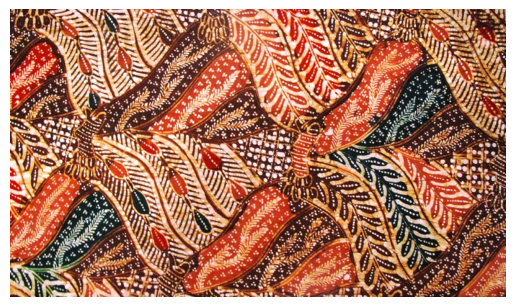

In [6]:
show_img(random_choice())

In [7]:
def build_histogram(image, bins=256):
    rgb_image = image
    plt.imshow(rgb_image)
    image_vector = rgb_image.reshape(1, -1, 3)
    # break into given number of bins
    div = 256 / bins
    bins_vector = (image_vector / div).astype(int)
    # get the red, green, and blue channels
    red = bins_vector[0, :, 0]
    green = bins_vector[0, :, 1]
    blue = bins_vector[0, :, 2]
    # build the histograms and display
    fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
    axs[0].hist(red, bins=bins, color='r')
    axs[1].hist(green, bins=bins, color='g')
    axs[2].hist(blue, bins=bins, color='b')
    plt.show()

batik-lasem (393, 700, 3)


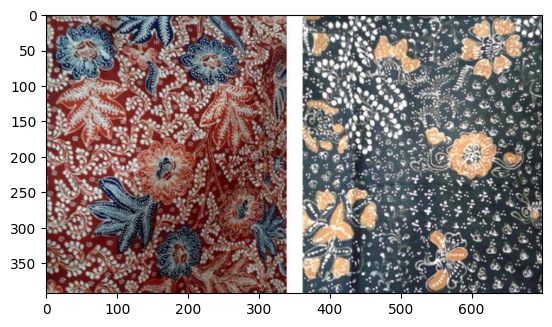

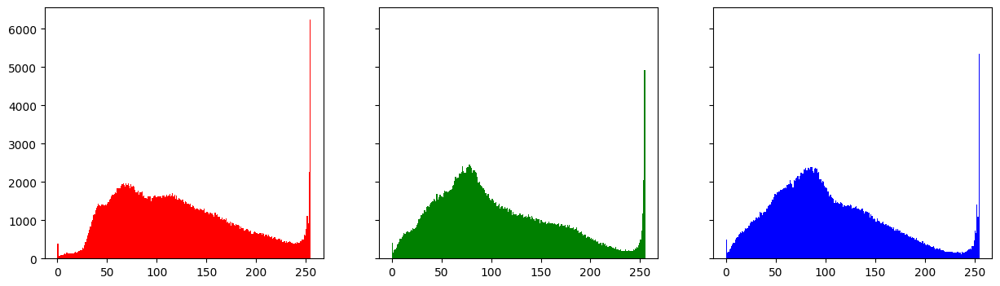

In [8]:
build_histogram(random_choice(), bins=256)

In [9]:
# how much data in each class
for i in class_data:
    locate = os.path.join(datas,i)
    image = os.listdir(locate)
    print(f"Ada {len(image)} foto {i}")

Ada 50 foto batik-pekalongan
Ada 50 foto batik-lasem
Ada 50 foto batik-parang
Ada 50 foto batik-priangan
Ada 46 foto batik-megamendung


Image data yang didapatkan cukup kecil untuk dilakukan training data, maka dari itu diperlukan data augmentasi.

In [10]:
# libary for augmention data
from tqdm import tqdm
from skimage.transform import rotate, AffineTransform, warp
from skimage.util import random_noise
from skimage.filters import gaussian

import tensorflow as tf

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [11]:
# Membuat dalam function agar mudah visualisasi
def visual(x,y):
    fig = plt.figure(figsize=(16,9))
    plt.subplot(1,2,1)
    plt.imshow(x)
    plt.subplot(1,2,2)
    plt.imshow(y)

batik-lasem (800, 1200, 3)


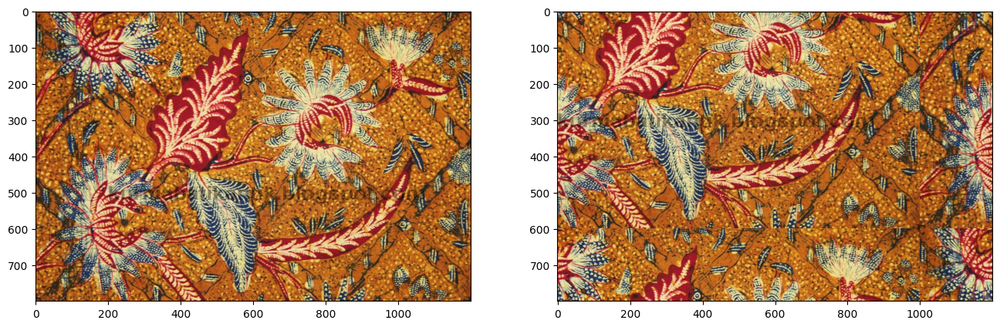

In [12]:
# wrap
x = random_choice()
transform = AffineTransform(translation=(200,200))
wraps = warp(x,transform,mode='wrap')
visual(x,wraps)

batik-megamendung (1920, 2560, 3)


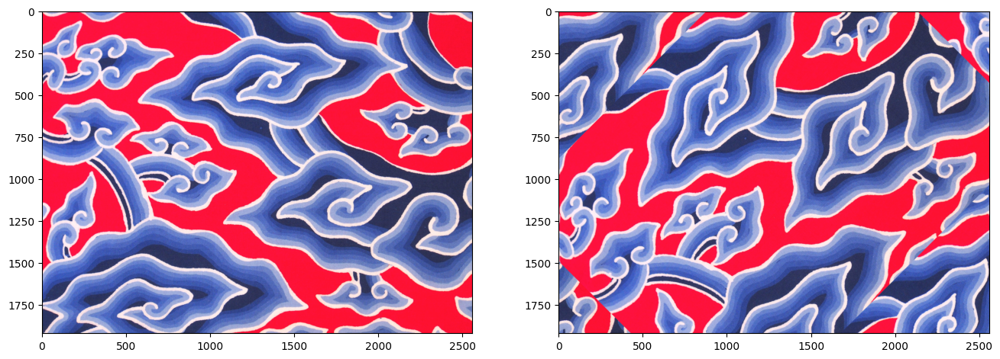

In [13]:
# rotate
x = random_choice()
muter = rotate(x, angle=45, mode = 'wrap')
visual(x,muter)

batik-pekalongan (240, 320, 3)


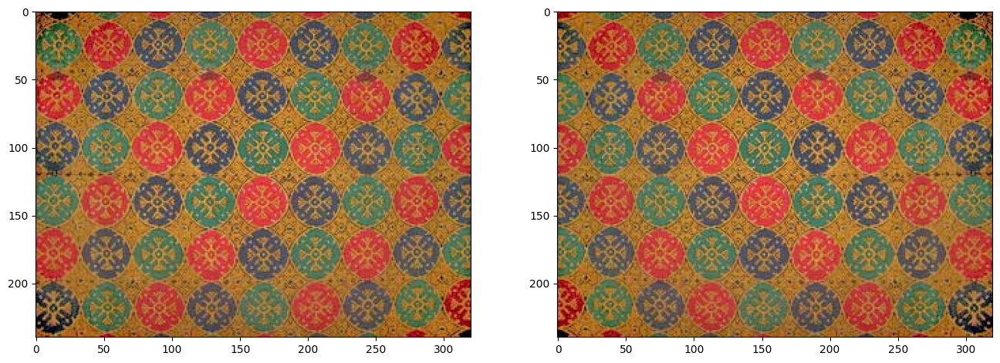

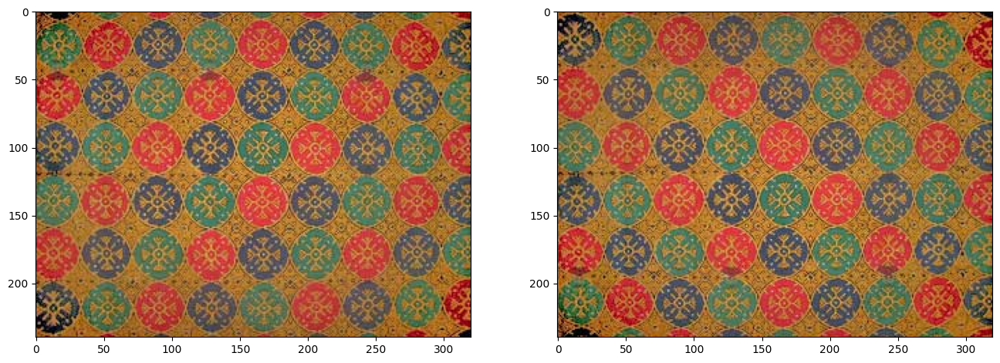

In [14]:
# flip
x = random_choice()

flip_kiri_kanan = tf.image.flip_left_right(x)
visual(x,flip_kiri_kanan)

flip_atas_bawah = tf.image.flip_up_down(x)
visual(x, flip_atas_bawah )

batik-megamendung (1920, 2560, 3)


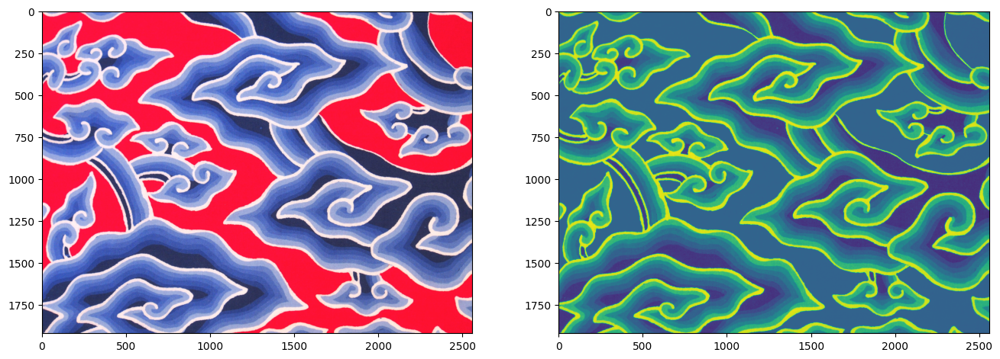

In [15]:
# greyscale
x = random_choice()
grey_image = tf.image.rgb_to_grayscale(x)
visual(x,grey_image)

batik-megamendung (736, 736, 3)


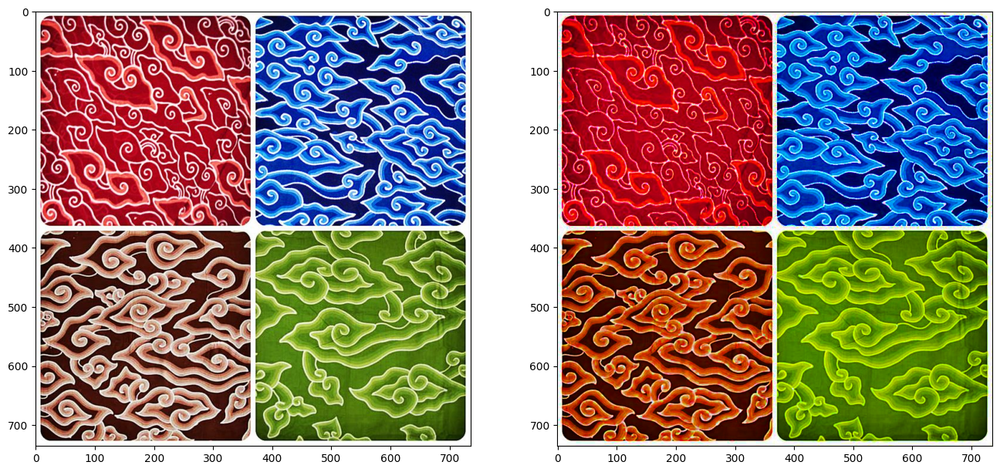

In [16]:
# saturation
x = random_choice()
satur = tf.image.adjust_saturation(x, 5)
visual(x,satur)

batik-priangan (1080, 1080, 3)


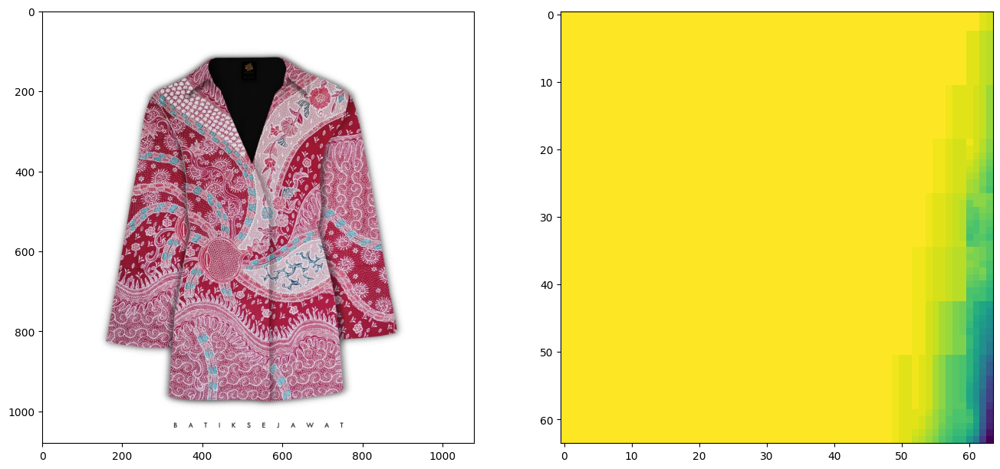

In [17]:
# random crop
x = random_choice()
crops = tf.image.random_crop(x, size=[64, 64, 1])
visual(x,crops)

batik-parang (1083, 750, 3)


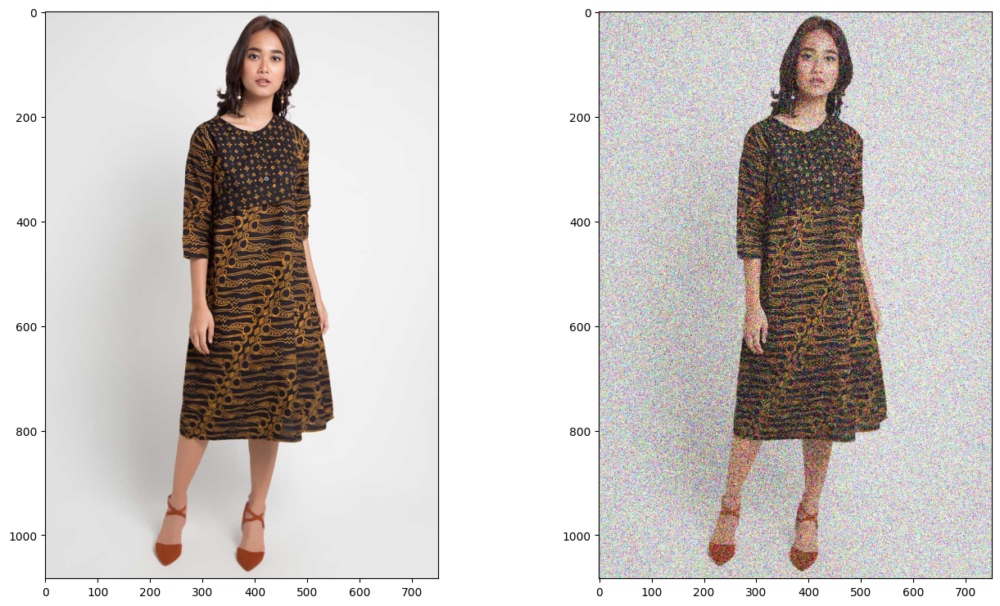

In [18]:
# noise
x = random_choice()
noise = random_noise(x,var=0.22*0.5)
visual(x,noise)

batik-parang (225, 300, 3)


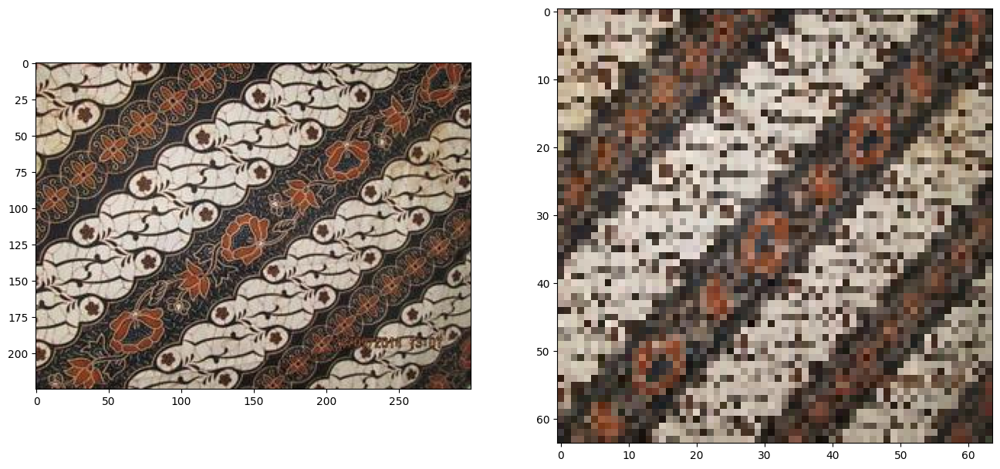

In [19]:
# See the image size in 64x64 to apply change in train data
size = 64
image = random_choice()
new_size = cv2.resize(image, (size,size))
visual(image,new_size)

Cara augmentation tersebut tidak akan dipanggil lagi, karena keras memiliki function yang langsung memanggil augmentation.

### 2B. [LO 3, 5 poin] Pisahkan dataset menjadi 80% training set, 10% validation set dan 10% test set.

Menggunakan library dari split folder untuk memudahkan proses pembagian

In [20]:
!pip install split-folders

In [21]:
import splitfolders
from tensorflow.keras.preprocessing.image import ImageDataGenerator

Membuat path folder output yang berisikan train, validation, dan test

In [22]:
os.makedirs('./output')
os.makedirs('./output/train')
os.makedirs('./output/val')
os.makedirs('./output/test')
os.listdir('./output')

['train', 'val', 'test']

In [23]:
splitfolders.ratio(datas, output="output", seed=1337, ratio=(.8, .1, .1), group_prefix=None) 

Copying files: 246 files [00:02, 101.63 files/s]


Data telah tercopy semua dan masuk kedalam folder, tetapi data masih belum di dalam suatu variabel. Maka dari itu diperlukan pembuatann variabel masing-masing train,val, dan test dengan bantuan image data generator

In [24]:
train_datagen=ImageDataGenerator(rescale=1./255,rotation_range=30,zoom_range=0.2,brightness_range=[0.4,1.5],vertical_flip=True)
val_datagen=ImageDataGenerator(rescale=1./255)
test_datagen=ImageDataGenerator(rescale=1./255)

train=train_datagen.flow_from_directory('/kaggle/working/output/train', target_size=(64, 64), batch_size=32, class_mode='categorical', seed=42)
val=val_datagen.flow_from_directory('/kaggle/working/output/val',target_size=(64, 64),batch_size=32, class_mode='categorical', seed=42)
test=test_datagen.flow_from_directory('/kaggle/working/output/test', target_size=(64, 64),batch_size=32, class_mode='categorical', seed=42)

Found 196 images belonging to 5 classes.
Found 24 images belonging to 5 classes.
Found 26 images belonging to 5 classes.


Dengan begitu image telah terbentuk dengan 196 train, 24 validation, dan 26 test. 

Selanjutnya akan ke pembuatan alexnet arsitektur

### 2C. [LO 3, 15 poin] Buatlah arsitektur baseline sesuai dengan gambar arsitektur AlexNet berikut ini: (Catatan: Activation function tiap hidden layer menggunakan ReLU)


# 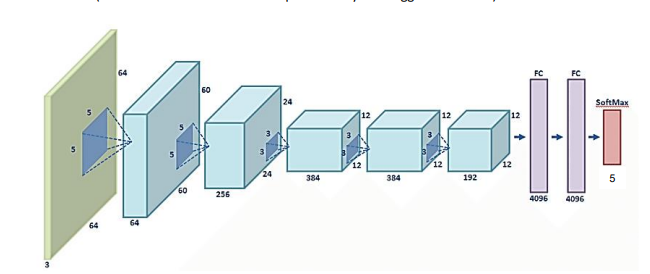

Dari arsiktektur ini terdapat 5 kali colvusion yang setelah ini baru di flaten dan masuk ke neural network. Pada akhirnya akan terdapat 5 layer output dengan activation fuction softmax.

In [25]:
# import library 

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.utils.np_utils import to_categorical

In [26]:
# model building
model = keras.models.Sequential([
    keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=(1,1), activation='relu', input_shape=(64,64,3),padding="valid"),
    keras.layers.MaxPool2D(pool_size=(14,14), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.MaxPool2D(pool_size=(2,2), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu',padding="same"),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.Conv2D(filters=192, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dense(5, activation='softmax')
])

In [27]:
model.compile(loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 60, 60, 64)        4864      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 256)       147712    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 12, 12, 256)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 12, 384)       885120    
                                                                 
 conv2d_3 (Conv2D)           (None, 12, 12, 384)       1

In [28]:
import time
root_logdir = os.path.join(os.curdir, "logs\\fit\\")

def get_run_logdir():
    run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)

In [29]:
Epochs = 50
base_model=model.fit(train, epochs=Epochs,  
                     validation_data=val, 
                     validation_freq=1,callbacks=[tensorboard_cb])

Epoch 1/50
7/7 [==============================] - 10s 487ms/step - loss: 5.8119 - accuracy: 0.1888 - val_loss: 1.6089 - val_accuracy: 0.2083
Epoch 2/50
7/7 [==============================] - 3s 421ms/step - loss: 1.6121 - accuracy: 0.2245 - val_loss: 1.6108 - val_accuracy: 0.2083
Epoch 3/50
7/7 [==============================] - 3s 418ms/step - loss: 1.6117 - accuracy: 0.1939 - val_loss: 1.6125 - val_accuracy: 0.2083
Epoch 4/50
7/7 [==============================] - 3s 457ms/step - loss: 1.6122 - accuracy: 0.2041 - val_loss: 1.6089 - val_accuracy: 0.2083
Epoch 5/50
7/7 [==============================] - 3s 416ms/step - loss: 1.6195 - accuracy: 0.1888 - val_loss: 1.6063 - val_accuracy: 0.2083
Epoch 6/50
7/7 [==============================] - 3s 404ms/step - loss: 1.6121 - accuracy: 0.1684 - val_loss: 1.5852 - val_accuracy: 0.3333
Epoch 7/50
7/7 [==============================] - 3s 435ms/step - loss: 1.6164 - accuracy: 0.2704 - val_loss: 1.5429 - val_accuracy: 0.3750
Epoch 8/50
7/7 [===

In [30]:
base_loss,base_acc=model.evaluate(test)
print("Accuracy of CNN Model: ",base_acc)
print("Loss of CNN Model: ",base_loss)

1/1 [==============================] - 0s 436ms/step - loss: 1.4387 - accuracy: 0.4615
Accuracy of CNN Model:  0.4615384638309479
Loss of CNN Model:  1.4387495517730713


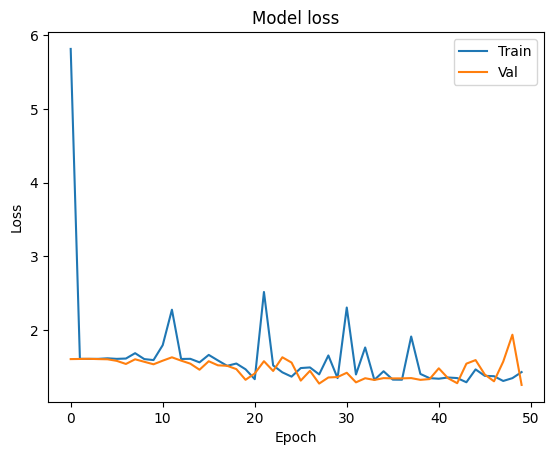

In [31]:
# plotting model loss
plt.plot(base_model.history['loss'])
plt.plot(base_model.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

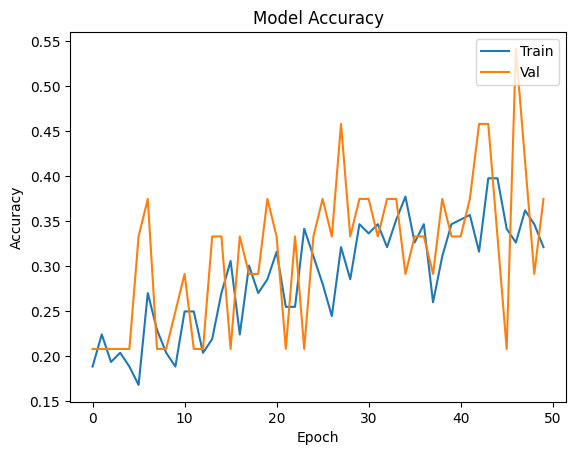

In [32]:
# plotting accuracy
plt.plot(base_model.history['accuracy'])
plt.plot(base_model.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

Dari sini dapat diketahui bahwa data yang dihasilkan overfit dan akurasi dari model walaupun cukup tinggi, yaitu 43%. Tapi saat di bandingkan dengan validasinya memiliki akurasi 20% begitu juga dengan akurasi dari test 23%nan. 

#### 2D. [LO 3, 25 poin] Modifikasi arsitektur AlexNet di atas agar mendapatkan hasil klasifikasi yang optimal. Kalian dapat menambahkan atau mengurangi arsitektur tersebutdan melakukan mengubah arsitektur pada nomor 2c dengan menggunakan dropout, batch normalization dan lain-lainnya. Dan selanjutnya lakukan proses tuning hyperparameter agar akurasi klasifikasinya meningkat. Berikan alasan mengapa modifikasi arsitektur dan metode tuning hyperparameter kalian lebih baik.

Mengganti epoch menjadi 100

Petama menggunakan struktur model yang sama lalu menambahkan dropout dan batch normalization

In [33]:
model_2a = keras.models.Sequential([
    keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=(1,1), activation='relu', input_shape=(64,64,3)),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(3,3), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(3,3), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=192, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(5, activation='softmax')
])

Tidak lupa juga menggunkan optimizer dari sgd

In [34]:
model_2a.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.SGD(lr=0.001),metrics=['accuracy'])
model_2a.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 60, 60, 64)        4864      
                                                                 
 batch_normalization (BatchN  (None, 60, 60, 64)       256       
 ormalization)                                                   
                                                                 
 conv2d_6 (Conv2D)           (None, 20, 20, 256)       147712    
                                                                 
 batch_normalization_1 (Batc  (None, 20, 20, 256)      1024      
 hNormalization)                                                 
                                                                 
 conv2d_7 (Conv2D)           (None, 7, 7, 384)         885120    
                                                                 
 batch_normalization_2 (Batc  (None, 7, 7, 384)       

In [35]:
Epochs = 100

Melihat hasil ouput dengan epoch 100

In [36]:
result1=model_2a.fit(train, epochs=Epochs,  
                     validation_data=val, 
                     validation_freq=1,callbacks=[tensorboard_cb])

Epoch 1/100
7/7 [==============================] - 5s 438ms/step - loss: 3.1543 - accuracy: 0.1888 - val_loss: 1.6269 - val_accuracy: 0.2083
Epoch 2/100
7/7 [==============================] - 3s 447ms/step - loss: 3.7248 - accuracy: 0.2704 - val_loss: 1.7120 - val_accuracy: 0.1667
Epoch 3/100
7/7 [==============================] - 3s 489ms/step - loss: 4.7848 - accuracy: 0.2449 - val_loss: 1.6086 - val_accuracy: 0.1250
Epoch 4/100
7/7 [==============================] - 3s 418ms/step - loss: 2.8737 - accuracy: 0.3214 - val_loss: 1.6495 - val_accuracy: 0.2917
Epoch 5/100
7/7 [==============================] - 3s 412ms/step - loss: 3.2475 - accuracy: 0.2500 - val_loss: 1.7229 - val_accuracy: 0.2083
Epoch 6/100
7/7 [==============================] - 3s 441ms/step - loss: 3.4391 - accuracy: 0.3061 - val_loss: 1.6066 - val_accuracy: 0.1667
Epoch 7/100
7/7 [==============================] - 3s 439ms/step - loss: 2.8106 - accuracy: 0.3163 - val_loss: 1.6350 - val_accuracy: 0.1667
Epoch 8/100
7

In [37]:
loss1,acc1=model_2a.evaluate(test)
print("Accuracy of CNN Model: ",acc1)
print("Loss of CNN Model: ",loss1)

1/1 [==============================] - 0s 338ms/step - loss: 2.9222 - accuracy: 0.3077
Accuracy of CNN Model:  0.3076923191547394
Loss of CNN Model:  2.9221997261047363


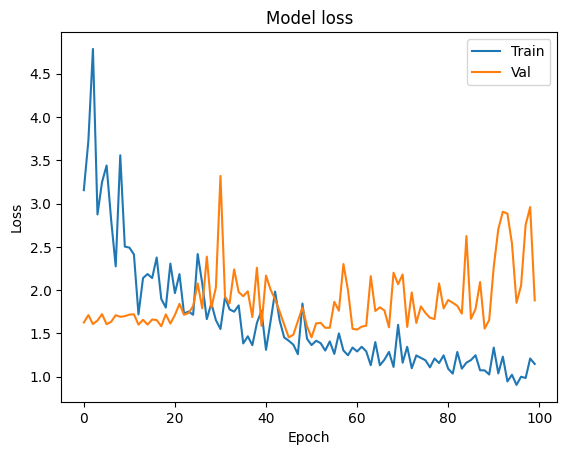

In [38]:
# plotting model loss
plt.plot(result1.history['loss'])
plt.plot(result1.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

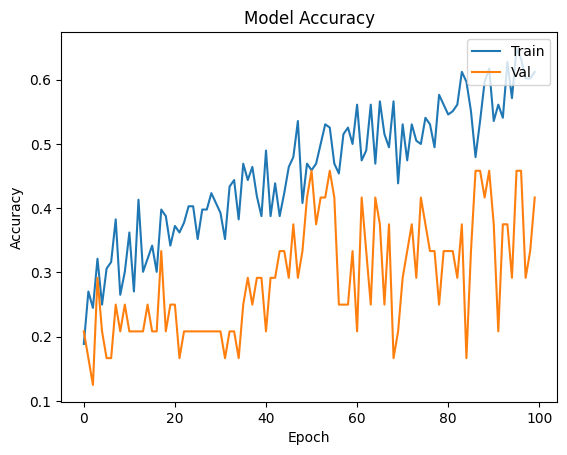

In [39]:
# plotting accuracy
plt.plot(result1.history['accuracy'])
plt.plot(result1.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

Dari sini dapat dilihat peningkatan terdapat model yang didapatkan adalah 62 persen. Untuk akurasi validasi dengan akurasi dengan test juga mengalami penningkatan, yaitu 41% untuk validasi dan 30% untuk test. 

Untuk plot dar.i model loss masih menunjukan hasil yang tidak baik, tetapi sudah mulai terlihat garis train hampir menuju 0.

Model ke 2, didalam model ini akan ada penambahan max pool. Dengan menggunkanan max pool dapat membuat fitur yang ada didalam image lebih sharper. max pool akan di taruh stelah convulsion 1 dan akhir. Sehingga akan terdapat 2 max pool. Dan juga menambahkan learning rate. 

In [40]:
model_2b = keras.models.Sequential([
    keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=(1,1), activation='relu', input_shape=(64,64,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(3,3), activation='relu', padding="valid"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(3,3), activation='relu', padding="valid"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=192, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(5, activation='softmax')
])

In [41]:
model_2b.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.Adam(lr=0.01),metrics=['accuracy'])
model_2b.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 60, 60, 64)        4864      
                                                                 
 batch_normalization_5 (Batc  (None, 60, 60, 64)       256       
 hNormalization)                                                 
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 29, 29, 64)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 9, 9, 256)         147712    
                                                                 
 batch_normalization_6 (Batc  (None, 9, 9, 256)        1024      
 hNormalization)                                                 
                                                      

In [42]:
result2=model_2b.fit(train, epochs=Epochs,  
                     validation_data=val, 
                     validation_freq=1,callbacks=[tensorboard_cb])

Epoch 1/100
7/7 [==============================] - 8s 437ms/step - loss: 5.1274 - accuracy: 0.2296 - val_loss: 1.8445 - val_accuracy: 0.2083
Epoch 2/100
7/7 [==============================] - 3s 448ms/step - loss: 2.3877 - accuracy: 0.2500 - val_loss: 2.7075 - val_accuracy: 0.2083
Epoch 3/100
7/7 [==============================] - 3s 429ms/step - loss: 1.8662 - accuracy: 0.3265 - val_loss: 2.0325 - val_accuracy: 0.2083
Epoch 4/100
7/7 [==============================] - 3s 437ms/step - loss: 1.8300 - accuracy: 0.3469 - val_loss: 1.7785 - val_accuracy: 0.2083
Epoch 5/100
7/7 [==============================] - 3s 468ms/step - loss: 1.6497 - accuracy: 0.3163 - val_loss: 1.6043 - val_accuracy: 0.1667
Epoch 6/100
7/7 [==============================] - 3s 386ms/step - loss: 1.8672 - accuracy: 0.2551 - val_loss: 1.6088 - val_accuracy: 0.2500
Epoch 7/100
7/7 [==============================] - 3s 445ms/step - loss: 1.5813 - accuracy: 0.3827 - val_loss: 1.6098 - val_accuracy: 0.1667
Epoch 8/100
7

In [43]:
loss2,acc2=model_2b.evaluate(test)
print("Accuracy of CNN Model: ",acc2)
print("Loss of CNN Model: ",loss2)

1/1 [==============================] - 0s 299ms/step - loss: 4.4970 - accuracy: 0.2308
Accuracy of CNN Model:  0.23076923191547394
Loss of CNN Model:  4.49703311920166


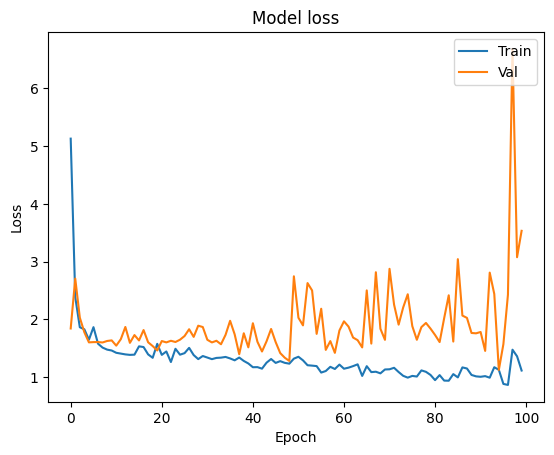

In [44]:
# plotting model loss
plt.plot(result2.history['loss'])
plt.plot(result2.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

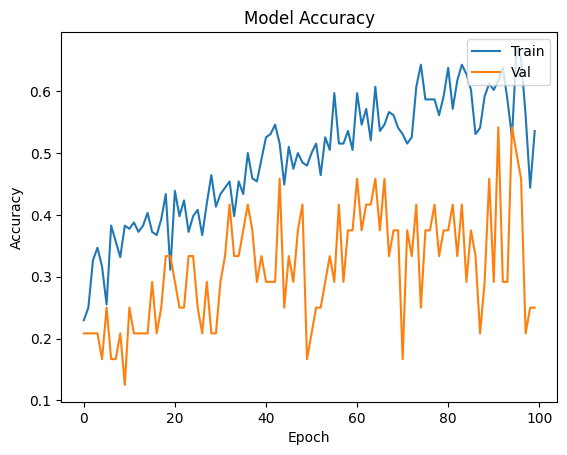

In [45]:
# plotting accuracy
plt.plot(result2.history['accuracy'])
plt.plot(result2.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

Dari hasil yang didapatkan plot model loss sudah memperlihatkan plot yang baik pada train, tetapi validasi masih terlihat tidak baik dan masih jauh dari train. Selain itu untuk akurasi model ini adalah 63% hampir sama dengan yang sebelumnya. Untuk validasi akurasinya 37% dan untuk test 38% lebih stabil daripada sebelumnya. 

Untuk model selanjutnya akan mencoba mengganti optimizer dari SGD menjadi adam untuk melihat akurasi yang dihasilkan.

In [46]:
from keras import regularizers

In [48]:
model_2c = keras.models.Sequential([
    keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=(1,1), activation='relu', input_shape=(64,64,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3),strides=(1,1)),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(2,2), activation='relu', padding="valid"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2,2), strides=(1,1)),
    keras.layers.Conv2D(filters=128, kernel_size=(3,3), strides=(1,1), activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=64, kernel_size=(3,3), strides=(1,1), activation='relu'),
    keras.layers.MaxPool2D(pool_size=(2,2), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(1200,kernel_regularizer=regularizers.l2(0.01),activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(5, activation='softmax')
])

In [49]:
model_2c.compile(loss='categorical_crossentropy',optimizer=tf.optimizers.Adam(learning_rate=0.001),metrics=['accuracy'])
model_2c.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 60, 60, 64)        4864      
                                                                 
 batch_normalization_10 (Bat  (None, 60, 60, 64)       256       
 chNormalization)                                                
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 58, 58, 64)       0         
 2D)                                                             
                                                                 
 conv2d_16 (Conv2D)          (None, 28, 28, 256)       147712    
                                                                 
 batch_normalization_11 (Bat  (None, 28, 28, 256)      1024      
 chNormalization)                                                
                                                      

In [50]:
result3=model_2c.fit(train, epochs=Epochs,  
                     validation_data=val,batch_size=15,
                     validation_freq=1,callbacks=[tensorboard_cb])

Epoch 1/100
7/7 [==============================] - 7s 558ms/step - loss: 17.8969 - accuracy: 0.2551 - val_loss: 14.3037 - val_accuracy: 0.1667
Epoch 2/100
7/7 [==============================] - 3s 443ms/step - loss: 14.5455 - accuracy: 0.2908 - val_loss: 13.3002 - val_accuracy: 0.2083
Epoch 3/100
7/7 [==============================] - 3s 470ms/step - loss: 13.4294 - accuracy: 0.2551 - val_loss: 12.5856 - val_accuracy: 0.2500
Epoch 4/100
7/7 [==============================] - 3s 447ms/step - loss: 12.5595 - accuracy: 0.3418 - val_loss: 12.4026 - val_accuracy: 0.1667
Epoch 5/100
7/7 [==============================] - 3s 489ms/step - loss: 11.6382 - accuracy: 0.3214 - val_loss: 11.6556 - val_accuracy: 0.1250
Epoch 6/100
7/7 [==============================] - 4s 553ms/step - loss: 10.9300 - accuracy: 0.3724 - val_loss: 11.7735 - val_accuracy: 0.2083
Epoch 7/100
7/7 [==============================] - 3s 412ms/step - loss: 10.3371 - accuracy: 0.3980 - val_loss: 11.0958 - val_accuracy: 0.2083

In [51]:
loss3,acc3=model_2c.evaluate(test)
print("Accuracy of CNN Model: ",acc3)
print("Loss of CNN Model: ",loss3)

1/1 [==============================] - 0s 366ms/step - loss: 2.7406 - accuracy: 0.3077
Accuracy of CNN Model:  0.3076923191547394
Loss of CNN Model:  2.7406129837036133


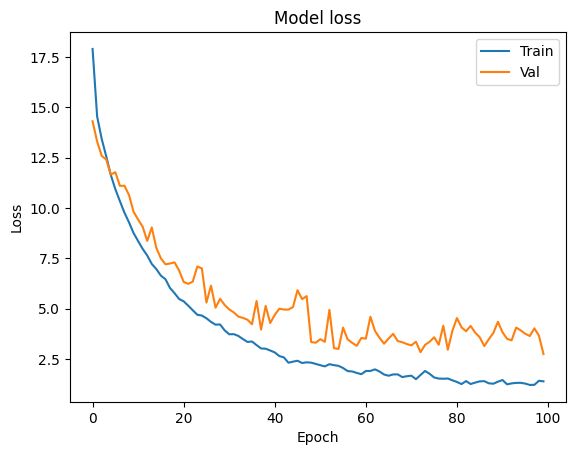

In [52]:
# plotting model loss
plt.plot(result3.history['loss'])
plt.plot(result3.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

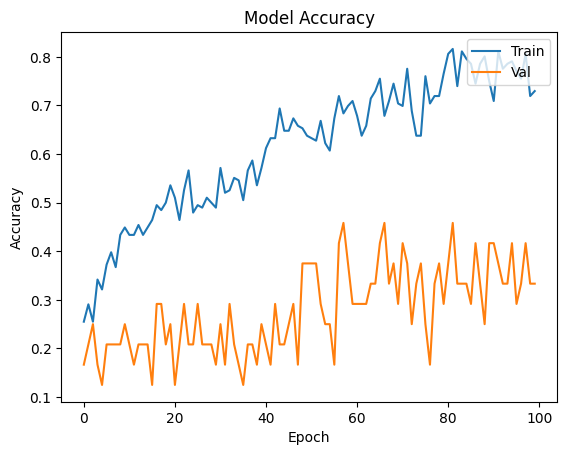

In [53]:
# plotting accuracy
plt.plot(result3.history['accuracy'])
plt.plot(result3.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

Model inilah yang menjadi final yang mana akan digunkanan dengan akurasi model final adalah 76%, Tetapi model tersebut memliki akurasi val 33% dan akutasi test adalah 34%. Hal ini dapat dikarenakan kekurangan data dari model yang membuat akurasi dari val dan test menurun. Tetapi plot model loss memiliki hasil yang baik. 

Berikut penjelasan model yang digunakan :
- arskitektur 
    
    Arsitektur akan diganti dari awalnya sedikit kompleks menjadi sederhana. Arsitektur yang digunakan sebgai berikut :
    
      input -> convulsion(k = 5,s = 1,f = 64) -> pool(k = 3,s = 1) -> convulison(k = 3,s = 2,f = 256) -> pool(k = 3,s = 1) -> convulison(k = 3,s = 1,f = 128) -> pool(k = 3,s = 2) -> convulison(k = 3,s = 1,f = 64) -> pool(k = 2,s = 2)
    Dengan penjelasan k adalah kernel size, s adalah stride, dan f adalah filter.
- activation function
    
    Pada arsitektur ini activation function di akhir layer akan ditambahkan dengan activation function softmax yang mana awalnya tidak terdapat activation function sama sekali.
- Batch Normalization

    Pada arsitektur  ini batch normlization akan di apply di setiap convulsion layer. Hal ini dilakukan untuk menurukan overfit dan menabahkan kecepatan model.
    
- Hidden layer

    Pada model ini hidden layer akan diubah yang mana awalnya 2 menjadi satu. Hal ini dikarenakan model ini perlu di simplekan karena sudah overfit dengan kompleknya model base.
    
- Jumlah neuron

    Pada model awalnya neuron yang diberikan 4090 hal ini dapat menurunkan loss model tapi akurasi model akan juga berkurang. Sehingga untuk menaikan akurasi haruslah diturunkan neuron yang akan digunkan sehingga dengan menggunkana 1200 dapat menaikan akurasi model. 
    
- Menambahakan drop out
   
    Pada hidden layer akan ditambahkan dropout untuk meingkat akurasi.
    
- Menambahkan regulasi
    
    Pada model ini juga aka ditambahkan regulasi yang mana dengan menambakan regulasi akan meingkatkan model loss karena regulasi akan menghilangkan beberapa layer setiap epoch agar mempercepat model. Tapi dengan menambahkan ini akan  meningkatkan akurasi model. 
    
- Menggunakan optimizer

    Pada model ini akan ditambahkan optimzer adam dengan leraning rate 0.01, optimizer akan membantu model meningkatkan akurasi dan juga kecepatannya dan juga learning rate yang rendah akan menghilangkan model spike di model lossnya. 

#### 2E. [LO 3, 5 poin] Evaluasi performa dari arsitektur nomor 2d dan jelaskan hasil yang kalian dapatkan. Gunakan testing set yang diberikan untuk memprediksi nilai ground truth dengan predicted result.

In [54]:
loss3,acc3=model_2c.evaluate(test)
print("Accuracy of CNN Model: ",acc3)
print("Loss of CNN Model: ",loss3)

1/1 [==============================] - 0s 271ms/step - loss: 2.7406 - accuracy: 0.3077
Accuracy of CNN Model:  0.3076923191547394
Loss of CNN Model:  2.740612506866455


Setelah di bentuk beberapa model model 2c lah yang dapat memenuhi dengan akurasi antar test size 34%. Walaupun terlihat kecil, hal ini dikarenakan kekurangan data yang didapatkan. Tetapi untuk tess loss dapat 3.7. 

Untuk melakukan meningkat performa dari model ini dapat dengan menambahkan dataset dan menggunakan gambar yang lebih jelas dengan bentuk dari batik yang digunakan. 

### 2F. [LO 1, LO 2, LO 3, LO 4 5 poin] Buatlah video presentasi yang menjelaskan arsitektur yang dibangun untuk mengklasifikasikan batik ini.

Link Video : https://drive.google.com/file/d/1t83v8CT8d9lLnSYiENNXsj-q--JbEtnh/view?usp=sharing